In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import numpy as np
import scanpy.external as sce

In [2]:
sc.settings.verbosity = 3  
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5))

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                         9.1.1
anyio                       NA
asciitree                   NA
attr                        21.2.0
babel                       2.9.1
backcall                    0.2.0
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.0
charset_normalizer          2.0.7
cloudpickle                 2.2.0
colorama                    0.4.6
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.1
dask                        2023.5.1
dateutil                    2.8.2
debugpy                     1.5.0
decorator                   5.1.1
defusedxml                  0.7.1
dill                        0.3.6
entrypoints                 0.3
fasteners                   0.18
fastjsonschema              NA
google                      NA
h5py                        3.7.0
idna                        3.3
igraph                      0.10.3
ipykernel 

In [3]:
samples_dict = {"Immature": "A0021_043", "0hr": "A0008_041", "1hr": "A0021_044", "4hr": "A0021_042", "6hr": "A0021_045", "8hr": "A0008_044", "11hr": "A0008_046", "12hr": "A0021_046"}

In [4]:
s_genes = list(pd.read_csv("./../../../../MouseInfection/s.genes.txt")["x"])
g2m_genes = list(pd.read_csv("./../../../../MouseInfection/g2m.genes.txt")["x"])
print(s_genes)
print(g2m_genes)

['Mcm4', 'Exo1', 'Slbp', 'Gmnn', 'Cdc45', 'Msh2', 'Mcm6', 'Rrm2', 'Pold3', 'Blm', 'Ubr7', 'Mcm5', 'Clspn', 'Hells', 'Nasp', 'Rpa2', 'Rad51ap1', 'Tyms', 'Rrm1', 'Rfc2', 'Prim1', 'Brip1', 'Usp1', 'Ung', 'Pola1', 'Mcm2', 'Fen1', 'Tipin', 'Pcna', 'Cdca7', 'Uhrf1', 'Casp8ap2', 'Cdc6', 'Dscc1', 'Wdr76', 'E2f8', 'Dtl', 'Ccne2', 'Atad2', 'Gins2', 'Chaf1b', 'Pcna-ps2']
['Nuf2', 'Psrc1', 'Ncapd2', 'Ccnb2', 'Smc4', 'Lbr', 'Tacc3', 'Cenpa', 'Kif23', 'Cdca2', 'Anp32e', 'G2e3', 'Cdca3', 'Anln', 'Cenpe', 'Gas2l3', 'Tubb4b', 'Cenpf', 'Dlgap5', 'Hjurp', 'Cks1brt', 'Gtse1', 'Bub1', 'Birc5', 'Ube2c', 'Rangap1', 'Hmmr', 'Ect2', 'Tpx2', 'Ckap5', 'Cbx5', 'Nek2', 'Ttk', 'Cdca8', 'Nusap1', 'Ctcf', 'Cdc20', 'Cks2', 'Mki67', 'Tmpo', 'Ckap2l', 'Aurkb', 'Kif2c', 'Cdk1', 'Kif20b', 'Top2a', 'Aurka', 'Ckap2', 'Hmgb2', 'Cdc25c', 'Ndc80', 'Kif11']


In [5]:
adata_ovary_combined = sc.read_h5ad("./../../pyobjs_github/adata_ovary_combined_processed_deconvoluted_newscaling.h5ad")
print(adata_ovary_combined.shape)

(121536, 2537)


In [6]:
adata_ovary_combined

AnnData object with n_obs × n_vars = 121536 × 2537
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'individual_leiden_1.0', 'individual_leiden_1.2', 'individual_leiden_1.5', 'Sample', 'S_score', 'G2M_score', 'phase', 'leiden_1.0', 'leiden_1.5', 'Level1_total_abundance', 'Level1_EN_Blood', 'Level1_EN_Lymph', 'Level1_Epithelium', 'Level1_GC_Antral', 'Level1_GC_Atretic', 'Level1_GC_CL_Active', 'Level1_GC_CL_Lytic', 'Level1_GC_Estrous', 'Level1_GC_Mitotic', 'Level1_GC_Mural', 'Level1_GC_Preantral', 'Level1_I_B_Cell', 'Level1_I_Dendritic_Cell', 'Level1_I_Granulocyte', 'Level1_I_Macrophage', 'Level1_I_T_Cell', 'Level1_M_Cortical Stroma', 'Level1_M_Dividing Mesenchyme', 'Level1_M_Immature Theca', 'Level1_M_Medullary Stroma', 'Level1_M_Pericyte', 'Level1_M_Smooth Muscle', 'Level1_M_Steroidogenic Theca', 'Level1_Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype', 'Level1_max_pred_celltype_group', 'Level0_total_abundance', 'L

In [7]:
adata_ovary_combined.obs["Sample"] = adata_ovary_combined.obs["Sample"].cat.rename_categories({"Immature": "Untreated", "0hr": "0h", "1hr": "1h", "4hr": "4h", "6hr": "6h", "8hr": "8h", "11hr": "11h", "12hr": "12h"})

In [8]:
adata_ovary_combined.obs

,barcode,x,y,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_counts,individual_leiden_1.0,individual_leiden_1.2,...,Level0_total_abundance,Level0_Endothelium,Level0_Epithelium,Level0_Granulosa,Level0_Immune,Level0_Mesenchyme,Level0_Oocyte,Level0_max_pred,Level0_max_pred_celltype,Coarse celltype
CCGATGGAGTCTTA-Immature,CCGATGGAGTCTTA,2513.0,4258.5,620,1029.0,18.0,1.749271,1029.0,6,8,...,1.050237,0.179592,0.150743,0.126318,0.044141,0.492789,0.006416,0.492789,Level0_Mesenchyme,Mesenchyme
GTGGCGGACGCCAA-Immature,GTGGCGGACGCCAA,2964.4,2999.9,937,1746.0,58.0,3.321879,1746.0,0,5,...,1.287198,0.040620,0.042551,0.215362,0.137269,0.494692,0.069507,0.494692,Level0_Mesenchyme,Mesenchyme
AAGGATACCTACAT-Immature,AAGGATACCTACAT,2891.7,2241.7,814,1410.0,33.0,2.340425,1410.0,1,2,...,1.052542,0.038795,0.089689,0.701381,0.066134,0.099950,0.004051,0.701381,Level0_Granulosa,Granulosa
TGTACCCTGGCGCT-Immature,TGTACCCTGGCGCT,3813.5,3647.2,832,1588.0,49.0,3.085642,1588.0,0,0,...,1.241827,0.037641,0.008154,0.087959,0.048817,0.793907,0.023522,0.793907,Level0_Mesenchyme,Mesenchyme
ACATCAACAGGGCA-Immature,ACATCAACAGGGCA,2928.1,2436.9,330,475.0,9.0,1.894737,475.0,1,2,...,0.535507,0.023834,0.029345,0.310402,0.090049,0.537102,0.009268,0.537102,Level0_Mesenchyme,Mesenchyme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACGATATGTTCTTA-12hr,ACGATATGTTCTTA,1374.2,1957.0,550,792.0,36.0,4.545455,792.0,2,1,...,0.596894,0.270773,0.188490,0.211845,0.061734,0.246881,0.020278,0.270773,Level0_Endothelium,Endothelium
CCTATGATCGCAAG-12hr,CCTATGATCGCAAG,2840.0,3238.4,710,1085.0,78.0,7.188940,1085.0,2,1,...,0.653811,0.050441,0.355826,0.140985,0.040076,0.395687,0.016985,0.395687,Level0_Mesenchyme,Mesenchyme
ACAGCCATGGACTC-12hr,ACAGCCATGGACTC,4382.8,2330.0,503,665.0,28.0,4.210526,665.0,0,0,...,0.400751,0.054731,0.083208,0.391310,0.425959,0.020449,0.024342,0.425959,Level0_Immune,Immune
CAGCATAGCAAACA-12hr,CAGCATAGCAAACA,3940.6,3682.0,635,898.0,23.0,2.561247,898.0,0,0,...,0.754643,0.072851,0.107211,0.252784,0.390174,0.119029,0.057951,0.390174,Level0_Immune,Immune


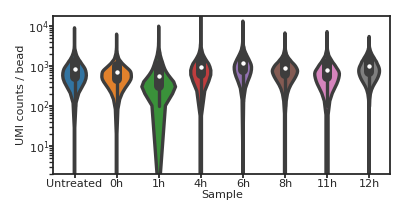

In [11]:
sc.settings.set_figure_params(dpi=80, fontsize=5, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
sns.set_style("ticks")
fig, ax = plt.subplots(figsize = (2.5,1.3))
plt.margins(x=0, y=0)
ax.tick_params(axis='both', which='major', pad=0, size = 2)
sns.violinplot(adata_ovary_combined.obs, y = "total_counts", x = "Sample", dodge=True, palette="tab10")
plt.rcParams['legend.title_fontsize'] = 9
# ax.set_ylim(0,5000)
ax.set_yscale("log")
ax.set_ylabel("UMI counts / bead", labelpad = 1.0)
ax.set_xlabel("Sample", labelpad = 0.5)
plt.tight_layout()
# plt.savefig("./figures/sample_total_counts.pdf")

In [13]:
# sc.settings.set_figure_params(dpi=80, fontsize=5, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
# sns.set_style("ticks")
# fig, ax = plt.subplots(figsize = (2.5,1.3))
# plt.margins(x=0, y=0)
# ax.tick_params(axis='both', which='major', pad=0, size = 2)
# sns.violinplot(adata_ovary_combined.obs, y = "n_genes_by_counts", x = "Sample", dodge=True, palette="tab10", ax=ax)
# plt.rcParams['legend.title_fontsize'] = 9
# # ax.set_ylim(0,5000)
# ax.set_yscale("log")
# ax.set_ylabel("Genes detected / bead", labelpad = 1.0)
# ax.set_xlabel("Sample", labelpad = 0.5)
# plt.tight_layout()
# plt.savefig("./figures/sample_n_genes_by_counts.pdf")

In [46]:
adata_ovary_combined = sc.read_h5ad("./../../pyobjs_github/adata_ovary_combined_processed_deconvoluted_newscaling.h5ad")
print(adata_ovary_combined.shape)

(121536, 2537)


In [47]:
granulosa_combined = sc.read_h5ad("./../../pyobjs_github/granulosa_individual_combined_newscaling.h5ad")
print(granulosa_combined.shape)

(63849, 31053)


In [48]:
mesenchyme_combined = sc.read_h5ad("./../../pyobjs_github/mesenchyme1.h5ad")
print(mesenchyme_combined.shape)

(36838, 504)


In [49]:
adata_ovary_combined.obs["FollicleNumber"] = sc.read_h5ad("./../../pyobjs_github/adata_ovary_combined_napari_processed.h5ad").obs["FollicleNumber"]
mode_df = pd.read_csv("./../metadata_csvs/follicle_metadata.csv", index_col=0)
mode_df = mode_df.drop(columns=["Sample"])
adata_ovary_combined.obs = adata_ovary_combined.obs.join(mode_df.set_index('FollicleNumber'), on='FollicleNumber')
adata_ovary_combined.obs["Follicle_type"] = adata_ovary_combined.obs["Follicle_type"].astype("category")
print(adata_ovary_combined.obs["Follicle_type"].cat.categories)
adata_ovary_combined.obs["Follicle_type"].cat.reorder_categories(
    new_categories = ['Preantral', 'Antral', 'Atretic', 'Lytic'], inplace = True)

Index(['Antral', 'Atretic', 'Lytic', 'Preantral'], dtype='object')


/tmp/ipykernel_2514448/415736806.py:7: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_ovary_combined.obs["Follicle_type"].cat.reorder_categories(


In [50]:
mode_df = pd.read_csv("./../metadata_csvs/follicle_metadata.csv")

In [17]:
freq_table = mode_df.groupby(['FollicleNumber', 'Sample', 'Follicle_type']).size().reset_index(name='count')
freq_table['mean_size'] = mode_df.groupby(["FollicleNumber", 'Sample', 'Follicle_type'])['size'].mean('mean').values
freq_table["Sample"] = freq_table["Sample"].astype("str")
freq_table = freq_table[freq_table["count"] > 0]
freq_table = freq_table[~freq_table["Follicle_type"].isin(["Transitioning"])]
freq_table['total_count'] = freq_table.groupby(["Sample"])['count'].transform('sum')
freq_table['proportion'] = freq_table['count'] / freq_table['total_count']
freq_table["Sample"] = freq_table["Sample"].astype("category")
freq_table["Sample"] = freq_table["Sample"].cat.reorder_categories(["Immature", "0hr", "1hr", "4hr", "6hr", "8hr", "11hr", "12hr"])
freq_table["Follicle_type"] = freq_table["Follicle_type"].astype("category")
# freq_table["Follicle_type"] = freq_table["Follicle_type"].cat.remove_categories(["Transitioning"])
freq_table["Follicle_type"] = freq_table["Follicle_type"].cat.reorder_categories(["Preantral", "Antral", "Atretic", "Lytic"])

In [52]:
# adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"granulosa_clusters"] = granulosa_combined.obs["granulosa_clusters"]
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"granulosa_celltypes"] = granulosa_combined.obs["granulosa_celltypes"]
granulosa_combined.obs.loc[granulosa_combined.obs["granulosa_celltypes_reduced"] == "Others", "granulosa_celltypes_reduced"] = "Mixed"
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"granulosa_celltypes_reduced"] = granulosa_combined.obs["granulosa_celltypes_reduced"]

In [51]:
# adata_ovary_combined.obs["oocyte_clusters"] = sc.read_h5ad("./../pyobjs/oocytes_combined.h5ad").obs["oocyte_clusters"]
# adata_ovary_combined.obs["mesenchyme_leiden_1.0"] = sc.read_h5ad("./../../pyobjs_github/mesenchyme1.h5ad").obs["mesenchyme_leiden_1.0"]
adata_ovary_combined.obs["mesenchyme_max_pred_celltype"] = sc.read_h5ad("./../../pyobjs_github/mesenchyme1.h5ad").obs["mesenchyme_max_pred_celltype"]
adata_ovary_combined.obs["mesenchyme_clusters"] = sc.read_h5ad("./../../pyobjs_github/mesenchyme1.h5ad").obs["mesenchyme_max_pred_celltype_reduced"]
adata_ovary_combined.obs["mesenchyme_clusters"] = adata_ovary_combined.obs["mesenchyme_clusters"].cat.reorder_categories(["M_Smooth muscle", "M_Theca cells", "M_Fibroblast-like cells", 'M_Dividing mesenchyme', "M_Pericytes"])

In [53]:
adata_ovary_combined.obs["Celltypes"] = [x.split("_")[1] for x in adata_ovary_combined.obs["Level0_max_pred_celltype"]]
adata_ovary_combined.obs["Celltypes"] = adata_ovary_combined.obs["Celltypes"].astype(str)
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"Celltypes"] = granulosa_combined.obs["granulosa_celltypes_reduced"]
adata_ovary_combined.obs.loc[mesenchyme_combined.obs_names,"Celltypes"] = mesenchyme_combined.obs["mesenchyme_max_pred_celltype_reduced"]
adata_ovary_combined.obs["Celltypes"] = adata_ovary_combined.obs["Celltypes"].astype("category")

In [54]:
adata_ovary_combined.obs["Celltypes"].cat.categories

Index(['Endothelium', 'Epithelium', 'GC_Cumulus-(Mixed)', 'GC_Lytic-(Lytic)',
       'GC_Mitotic-(Antral)', 'GC_Mural-(Antral)', 'GC_Mural-(Atretic)',
       'GC_Mural-(Preantral)', 'Immune', 'M_Dividing mesenchyme',
       'M_Fibroblast-like cells', 'M_Pericytes', 'M_Smooth muscle',
       'M_Theca cells', 'Mixed', 'Oocyte'],
      dtype='object')

In [55]:
adata_ovary_combined.obs["BroadCelltype"] = [x.split("_")[1] for x in adata_ovary_combined.obs["Level0_max_pred_celltype"].values]
adata_ovary_combined.obs["BroadCelltype"] = adata_ovary_combined.obs["BroadCelltype"].astype("category")
adata_ovary_combined.obs["BroadCelltype"] = adata_ovary_combined.obs["BroadCelltype"].cat.reorder_categories(["Mesenchyme", "Granulosa", "Oocyte", "Endothelium", "Epithelium", "Immune"])

In [56]:
apoptosis_genes = pd.read_csv("./../../pyobjs_github/apoptosis_genes.csv")["mmusculus_homolog_associated_gene_name"]
print(len(apoptosis_genes))
print(apoptosis_genes)
sc.tl.score_genes(granulosa_combined, gene_list=list(apoptosis_genes), score_name="Negative regulation of apoptosis score")
if "Negative regulation of apoptosis score" in adata_ovary_combined.obs.columns.values:
    adata_ovary_combined.obs = adata_ovary_combined.obs.drop(columns="Negative regulation of apoptosis score")
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"Negative regulation of apoptosis score"] = granulosa_combined.obs["Negative regulation of apoptosis score"]

12
0       Comp
1      Socs2
2      Grem1
3       Dab2
4      Ccnd2
5       Akt2
6      Gata6
7      Birc5
8        Mif
9     Trim27
10      Gas6
11     Foxo1
Name: mmusculus_homolog_associated_gene_name, dtype: object
computing score 'Negative regulation of apoptosis score'
    finished: added
    'Negative regulation of apoptosis score', score of gene set (adata.obs).
    149 total control genes are used. (0:00:10)


In [57]:
samples_dict = {"Immature": "A0021_043", "0hr": "A0008_041", "1hr": "A0021_044", "4hr": "A0021_042", "6hr": "A0021_045", "8hr": "A0008_044", "11hr": "A0008_046", "12hr": "A0021_046"}
granulosa_combined.obs["Sample"] = granulosa_combined.obs["batch"] 
granulosa_combined = granulosa_combined[granulosa_combined.obs["Sample"].isin(samples_dict.keys())]
granulosa_combined.obs["Sample"] = granulosa_combined.obs["Sample"].astype(str)
granulosa_combined.obs["Sample"] = granulosa_combined.obs["Sample"].astype("category")
granulosa_combined.obs["Sample"] = granulosa_combined.obs["Sample"].cat.reorder_categories(["Immature", "0hr", "1hr", "4hr", "6hr", "8hr", "11hr", "12hr"])
granulosa_combined.obs["Sample"]= granulosa_combined.obs["Sample"].astype("category")

/tmp/ipykernel_2514448/3092904244.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  granulosa_combined.obs["Sample"] = granulosa_combined.obs["Sample"].astype(str)


In [58]:
granulosa_combined = granulosa_combined[~granulosa_combined.obs["granulosa_celltypes_reduced"].isin(["Mixed", "Others"])]
granulosa_combined.obs["Follicle_type"] = adata_ovary_combined.obs.loc[granulosa_combined.obs_names, "Follicle_type"]
granulosa_combined.obs["FollicleNumber"] = adata_ovary_combined.obs.loc[granulosa_combined.obs_names, "FollicleNumber"]

/tmp/ipykernel_2514448/2969832373.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  granulosa_combined.obs["Follicle_type"] = adata_ovary_combined.obs.loc[granulosa_combined.obs_names, "Follicle_type"]


In [28]:
granulosa_combined.obs["timepoint"] = granulosa_combined.obs["Sample"]
celltypes = {'Immature': -1, 
             '0hr': 0, 
            '1hr': 1, 
            '4hr': 4, 
            '6hr': 6, 
            '8hr': 8, 
            '11hr': 11,
            '12hr': 12}
granulosa_combined.obs["timepoint"] = granulosa_combined.obs["timepoint"].map(celltypes)
# granulosa_combined.obs["timepoint"] = granulosa_combined.obs["timepoint"].astype(np.int_)

In [49]:
temp = granulosa_combined[~granulosa_combined.obs["granulosa_celltypes_reduced"].isin(["GC_Cumulus-(Mixed)"])]
temp = temp[~temp.obs["Sample"].isin(["Immature"])]

In [29]:
# sc.settings.set_figure_params(dpi=80, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
# sns.set_style("ticks")
# fig, ax = plt.subplots(figsize = (1.5,1.4))
# plt.margins(x=0, y=0)
# ax.tick_params(axis='both', which='major', pad=0, size = 2)
# g = sns.lineplot(temp.obs, y = "Negative regulation of apoptosis score", x = "timepoint", hue = "Follicle_type", palette="tab10", ax=ax)
# plt.rcParams['legend.title_fontsize'] = 9
# # ax.set_ylim(0,5000)
# # ax.set_yscale("log")
# g.set_xticks(range(0, 13, 2))
# ax.set_ylabel("Negative regulation of\n apoptosis module score", labelpad = 1.0)
# ax.set_xlabel("Hours after hCG treatment", labelpad = 0.5)
# plt.legend(ncol=1, prop={'size': 6}, loc = 6, handletextpad=0.5, markerscale = 0.6, title = "Follicle type", 
#            labelspacing = 0.0, frameon = False, title_fontsize = 6, alignment = "left", 
#            borderpad = 0.1, borderaxespad = 0.1, bbox_to_anchor = (1.02, 0.5))
# # plt.tight_layout()
# plt.savefig("./figures/follicle_type_apoptosis_violin.pdf")

In [ ]:
temp = granulosa_combined[~granulosa_combined.obs["granulosa_celltypes_reduced"].isin(["GC_Cumulus-(Mixed)"])]
# temp = temp[~temp.obs["Sample"].isin(["IM"])]

In [ ]:
sc.settings.set_figure_params(dpi=80, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
sns.set_style("ticks")
fig, ax = plt.subplots(figsize = (1.7,1.4))
plt.margins(x=0, y=0)
ax.tick_params(axis='both', which='major', pad=0, size = 2)
sns.lineplot(temp.obs, y = "G2M_score", x = "Sample", hue = "Follicle_type", palette="tab10", ax=ax)
plt.rcParams['legend.title_fontsize'] = 9
# ax.set_ylim(0,5000)
# ax.set_yscale("log")
ax.set_ylabel("G2M score", labelpad = 1.0)
ax.set_xlabel("Sample", labelpad = 0.5)
plt.legend(ncol=1, prop={'size': 6}, loc = 6, handletextpad=0.5, markerscale = 0.6, title = "Follicle type", 
           labelspacing = 0.0, frameon = False, title_fontsize = 6, alignment = "left", 
           borderpad = 0.1, borderaxespad = 0.1, bbox_to_anchor = (1.02, 0.5))
# plt.tight_layout()
plt.savefig("./figures/follicle_type_G2M_score.pdf")

In [ ]:
freq_table = temp.obs.groupby(['FollicleNumber', "Sample", "phase"]).size().reset_index(name='count')
freq_table['total_count'] = freq_table.groupby(['FollicleNumber', "Sample"])['count'].transform('sum')
freq_table['proportion'] = freq_table['count'] / freq_table['total_count']
# freq_table["Follicle_type"] = freq_table["Follicle_type"].cat.remove_categories(["Lytic"])
# freq_table["Follicle_type"] = freq_table["Follicle_type"].cat.reorder_categories(["Preantral", "Antral", "Atretic", "Transitioning"])
freq_table = freq_table[freq_table["count"] > 0]
freq_table.head(20)

In [ ]:
sc.settings.set_figure_params(dpi=80, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
sns.set_style("ticks")
fig, ax = plt.subplots(figsize = (2.4,1.5))
plt.margins(x=0, y=0)
ax.tick_params(axis='both', which='major', pad=0, size = 2)
sns.barplot(freq_table, x = "Sample", y = "proportion", dodge=True, hue="phase", palette="Set2", ax=ax)
plt.legend(ncol=1, prop={'size': 6}, handletextpad=0.5, markerscale = 0.6, title = "Cell cycle",
           labelspacing = 0.0, frameon = False,  title_fontsize = 7, alignment = "left", 
           borderpad = 0.1, borderaxespad = 0.1, loc = 1, bbox_to_anchor = (1.0, 1.0))
plt.rcParams['legend.title_fontsize'] = 9
ax.set_ylim(0,1.0)
ax.set_ylabel("Follicle type", labelpad = 0)
ax.set_xlabel("Cell proportions", labelpad = 1.0)
plt.tight_layout()
plt.savefig("./figures/cellcycle_all_granulosa_mural.pdf")

In [ ]:
temp = granulosa_combined[granulosa_combined.obs["granulosa_celltypes_reduced"].isin(["GC_Mural-(Antral)", "GC_Cumulus-(Mixed)"])]

In [ ]:
sc.settings.set_figure_params(dpi=80, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
sns.set_style("ticks")
fig, ax = plt.subplots(figsize = (1.5,1.4))
plt.margins(x=0, y=0)
ax.tick_params(axis='both', which='major', pad=0, size = 2)
g = sns.lineplot(temp.obs, y = "Negative regulation of apoptosis score", x = "timepoint", hue = "granulosa_celltypes_reduced", palette="tab10", ax=ax)
plt.rcParams['legend.title_fontsize'] = 9
# ax.set_ylim(0,5000)
# ax.set_yscale("log")
g.set_xticks(range(0, 13, 2))
ax.set_ylabel("Negative regulation of\n apoptosis module score", labelpad = 1.0)
ax.set_xlabel("Hours after hCG treatment", labelpad = 0.5)
plt.legend(ncol=1, prop={'size': 6}, loc = 6, handletextpad=0.5, markerscale = 0.6, title = "Granulosa celltype", 
           labelspacing = 0.0, frameon = False, title_fontsize = 6, alignment = "left", 
           borderpad = 0.1, borderaxespad = 0.1, bbox_to_anchor = (1.02, 0.5))
# plt.tight_layout()
plt.savefig("./figures/antral_apoptosis_violin.pdf")

In [ ]:
# mesenchyme_genes = pd.read_csv("./../pyobjs/.csv")["mmusculus_homolog_associated_gene_name"]
mesenchyme_genes = ["Pdgfrb", "Lmod1", "Myom1"]
print(len(mesenchyme_genes))
sc.tl.score_genes(mesenchyme_combined, gene_list=list(mesenchyme_genes), score_name="Mesenchyme contraction")
if "Mesenchyme contraction" in adata_ovary_combined.obs.columns.values:
    adata_ovary_combined.obs = adata_ovary_combined.obs.drop(columns="Mesenchyme contraction")
adata_ovary_combined.obs.loc[mesenchyme_combined.obs_names,"Mesenchyme contraction"] = mesenchyme_combined.obs["Mesenchyme contraction"]

In [ ]:
fig, axs = plt.subplots(2,4, figsize = (20,8))
for i, sample in enumerate(samples_dict.keys()):
    sc.settings.set_figure_params(dpi=200, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample], color = ["Akt2"], show=False, wspace= 0.2, hspace=0.2, spot_size = 30, frameon=False, title=sample, ax=axs[int(i/4), int(i%4)], cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True))  

In [ ]:
fig, axs = plt.subplots(2,4, figsize = (20,8))
for i, sample in enumerate(samples_dict.keys()):
    sc.settings.set_figure_params(dpi=200, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample], color = ["Plau"], show=False, wspace= 0.2, hspace=0.2, spot_size = 30, frameon=False, title=sample, ax=axs[int(i/4), int(i%4)], cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True))  

In [ ]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=5, facecolor='white', frameon=False, figsize=(5.0,5.0), transparent=True, format="pdf")
feature = "Negative regulation of apoptosis score"
fig, axs = plt.subplots(2,4, figsize = (20,12))
axs = axs.flatten()
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    sc.pl.spatial(subset, color = feature, wspace= 0.0, hspace = 0.0, spot_size = 30,
                  frameon=False, title=sample, show=False, ax=axs[i], na_color="lightgrey",
                  cmap="viridis", vmax="p99.2")
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1, len(samples_dict)+1):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i], 
                 fraction=0.25, aspect=7,
                 pad=0 , shrink = 0.3, location = "bottom")
for i in range(1,len(samples_dict)+1):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig("./figures/spatial_maps_apoptosis.pdf")

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical
... storing 'FollicleNumber' as categorical


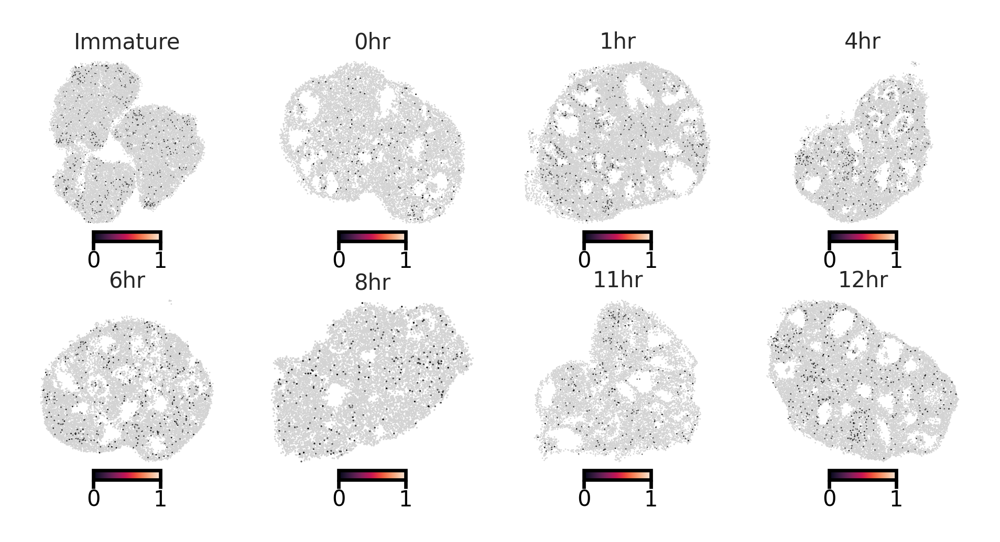

In [27]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=5, facecolor='white', frameon=False, figsize=(0.8,0.8), transparent=True, format="pdf")
feature = "Irx3"
fig, axs = plt.subplots(2,4, figsize = (4,2))
axs = axs.flatten()
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    sc.pl.spatial(subset, color = feature, wspace= 0.0, hspace = 0.0, spot_size = 30,
                  frameon=False, title=sample, show=False, ax=axs[i], na_color="lightgrey",
                  cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.9")
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1, len(samples_dict)+1):
    mappable = fig.axes[-i].collections[0]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i], 
                 fraction=0.25, aspect=7,
                 pad=0 ,shrink = 0.3, location = "bottom")
for i in range(1,len(samples_dict)+1):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
plt.subplots_adjust(wspace=0, hspace=0)
# plt.savefig("./figures/spatial_maps_Irx3.pdf")

In [ ]:
# adata_ovary_combined.obs["granulosa_celltypes_reduced"] = adata_ovary_combined.obs["Level0_max_pred_celltype"]
# adata_ovary_combined.obs["granulosa_celltypes_reduced"] = adata_ovary_combined.obs["granulosa_celltypes_reduced"].astype(str)
# adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"granulosa_celltypes_reduced"] = granulosa_combined.obs["granulosa_celltypes_reduced"]
# adata_ovary_combined.obs["granulosa_celltypes_reduced"] = adata_ovary_combined.obs["granulosa_celltypes_reduced"].astype("category")

In [ ]:
# adata_ovary_combined.obs["granulosa_clusters"] = adata_ovary_combined.obs["Level0_max_pred_celltype"]
# adata_ovary_combined.obs["granulosa_clusters"] = adata_ovary_combined.obs["granulosa_clusters"].astype(str)
# adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"granulosa_clusters"] = granulosa_combined.obs["granulosa_clusters"]
# adata_ovary_combined.obs["granulosa_clusters"] = adata_ovary_combined.obs["granulosa_clusters"].astype("category")

In [ ]:
# adata_ovary_combined.obs["mesenchyme_clusters"] = adata_ovary_combined.obs["Level1_max_pred_celltype"]
# adata_ovary_combined.obs["mesenchyme_clusters"] = adata_ovary_combined.obs["mesenchyme_clusters"].astype(str)
# adata_ovary_combined.obs.loc[adata_ovary_combined.obs["Level1_max_pred_celltype_group"] != "M", "mesenchyme_clusters"] = np.NAN
# adata_ovary_combined.obs["mesenchyme_clusters"] = adata_ovary_combined.obs["mesenchyme_clusters"].astype("category")


In [35]:
from pylab import *
cmap = cm.get_cmap('tab20')
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
cmap

In [59]:
cat_custom = [ 'GC_Mural-(Antral)', 'GC_Mural-(Atretic)', 'GC_Cumulus-(Mixed)', 'GC_Lytic-(Lytic)', 'GC_Mitotic-(Antral)', 
       'GC_Mural-(Preantral)', 'M_Smooth muscle', 'M_Theca cells', 'M_Fibroblast-like cells', 'M_Dividing mesenchyme',
 'M_Pericytes', 'Oocyte', 'Endothelium', 'Epithelium', 'Immune', "Mixed"]

In [60]:
adata_ovary_combined.obs["Celltypes"] = adata_ovary_combined.obs["Celltypes"].cat.reorder_categories(cat_custom)

<ipython-input-36-922edaec7fe2>:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)


Index(['GC_Mural-(Antral)', 'GC_Mural-(Atretic)', 'GC_Cumulus-(Mixed)',
       'GC_Lytic-(Lytic)', 'GC_Mitotic-(Antral)', 'GC_Mural-(Preantral)',
       'M_Smooth muscle', 'M_Theca cells', 'M_Fibroblast-like cells',
       'M_Dividing mesenchyme', 'M_Pericytes', 'Oocyte', 'Endothelium',
       'Epithelium', 'Immune', 'Mixed'],
      dtype='object')


<ipython-input-36-922edaec7fe2>:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)


Index(['GC_Mural-(Antral)', 'GC_Mural-(Atretic)', 'GC_Cumulus-(Mixed)',
       'GC_Lytic-(Lytic)', 'GC_Mitotic-(Antral)', 'GC_Mural-(Preantral)',
       'M_Smooth muscle', 'M_Theca cells', 'M_Fibroblast-like cells',
       'M_Dividing mesenchyme', 'M_Pericytes', 'Oocyte', 'Endothelium',
       'Epithelium', 'Immune', 'Mixed'],
      dtype='object')
Index(['GC_Mural-(Antral)', 'GC_Mural-(Atretic)', 'GC_Cumulus-(Mixed)',
       'GC_Lytic-(Lytic)', 'GC_Mitotic-(Antral)', 'GC_Mural-(Preantral)',
       'M_Smooth muscle', 'M_Theca cells', 'M_Fibroblast-like cells',
       'M_Dividing mesenchyme', 'M_Pericytes', 'Oocyte', 'Endothelium',
       'Epithelium', 'Immune', 'Mixed'],
      dtype='object')
Index(['GC_Mural-(Antral)', 'GC_Mural-(Atretic)', 'GC_Cumulus-(Mixed)',
       'GC_Lytic-(Lytic)', 'GC_Mitotic-(Antral)', 'GC_Mural-(Preantral)',
       'M_Smooth muscle', 'M_Theca cells', 'M_Fibroblast-like cells',
       'M_Dividing mesenchyme', 'M_Pericytes', 'Oocyte', 'Endothelium',
       'Ep

FileNotFoundError: [Errno 2] No such file or directory: './figures/spatial_maps_allcelltypes.pdf'

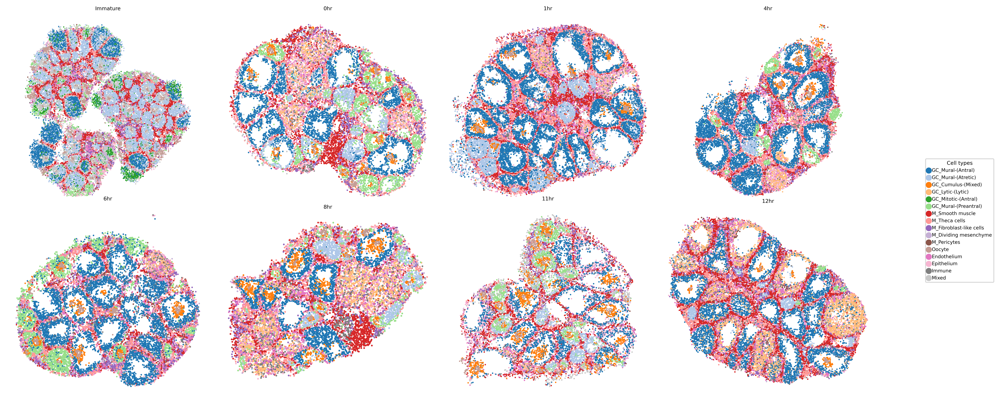

In [36]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "Celltypes"
fig, axs = plt.subplots(2,4, figsize = (18,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)])
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)])  
fig.legend(handles, labels, ncol = 1, loc=6, bbox_to_anchor = (1.0,0.5), title = "Cell types")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_allcelltypes.pdf")

In [37]:
adata_ovary_combined

AnnData object with n_obs × n_vars = 121536 × 2537
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'individual_leiden_1.0', 'individual_leiden_1.2', 'individual_leiden_1.5', 'Sample', 'S_score', 'G2M_score', 'phase', 'leiden_1.0', 'leiden_1.5', 'Level1_total_abundance', 'Level1_EN_Blood', 'Level1_EN_Lymph', 'Level1_Epithelium', 'Level1_GC_Antral', 'Level1_GC_Atretic', 'Level1_GC_CL_Active', 'Level1_GC_CL_Lytic', 'Level1_GC_Estrous', 'Level1_GC_Mitotic', 'Level1_GC_Mural', 'Level1_GC_Preantral', 'Level1_I_B_Cell', 'Level1_I_Dendritic_Cell', 'Level1_I_Granulocyte', 'Level1_I_Macrophage', 'Level1_I_T_Cell', 'Level1_M_Cortical Stroma', 'Level1_M_Dividing Mesenchyme', 'Level1_M_Immature Theca', 'Level1_M_Medullary Stroma', 'Level1_M_Pericyte', 'Level1_M_Smooth Muscle', 'Level1_M_Steroidogenic Theca', 'Level1_Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype', 'Level1_max_pred_celltype_group', 'Level0_total_abundance', 'L

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10')
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
cmap

In [ ]:
adata_ovary_combined.obs.loc[adata_ovary_combined.obs["granulosa_celltypes_reduced"] == "Mixed", "granulosa_celltypes_reduced"] = np.NAN
cat_custom = ['GC_Mural-(Preantral)', 'GC_Mural-(Antral)',  'GC_Mitotic-(Antral)', 'GC_Mural-(Atretic)', 'GC_Lytic-(Lytic)', 
        'GC_Cumulus-(Mixed)']

In [ ]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "granulosa_celltypes_reduced"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 8, loc='lower center', bbox_to_anchor = (0.5,0.0), title = "Mesenchyme cell types")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_granulosa.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "mesenchyme_clusters"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom[0:5], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom[0:5], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 8, loc='lower center', bbox_to_anchor = (0.5,0.0), title = "Mesenchyme cell types")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_mesenchyme.pdf")

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10', 6)
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
cmap

In [ ]:
from pylab import *
cmap = cm.get_cmap('Set1', 10)
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "BroadCelltype"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom, wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 6, loc='lower center', bbox_to_anchor = (0.57,0.1), title = "Cell types")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_broadcelltypes.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "phase"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
#     subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 8, loc='lower center', bbox_to_anchor = (0.5,0.0), title = "Cell cycle phase")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_phase.pdf")

FileNotFoundError: [Errno 2] No such file or directory: './figures/Endothelium_trends.pdf'

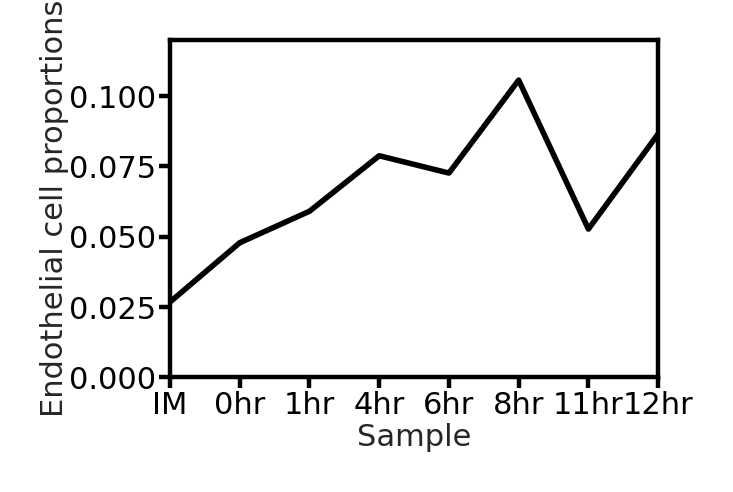

In [30]:
freq_table = adata_ovary_combined.obs.groupby(['Sample', 'BroadCelltype']).size().reset_index(name='count')
freq_table['total_count'] = freq_table.groupby(["Sample"])['count'].transform('sum')
freq_table['proportion'] = freq_table['count'] / freq_table['total_count']
freq_table = freq_table[freq_table["Sample"].isin(list(samples_dict.keys()))]
freq_table["Sample"] = freq_table["Sample"].astype(str)
freq_table["Sample"] = freq_table["Sample"].astype("category")
freq_table["Sample"] = freq_table["Sample"].cat.rename_categories({"Immature": "IM"})
freq_table["Sample"] = freq_table["Sample"].cat.reorder_categories(["IM", "0hr", "1hr", "4hr", "6hr", "8hr", "11hr", "12hr"])
freq_table["Sample"] = freq_table["Sample"].astype("category")
freq_table = freq_table[freq_table["BroadCelltype"] == "Endothelium"]

sc.settings.set_figure_params(dpi=200, fontsize=5.5, facecolor='white', frameon=True, figsize=(5, 5))
fig, ax = plt.subplots(figsize = (1.8,1.2))
plt.grid(False)
sns.set_style("ticks")
plt.margins(x=0, y=0)
ax.tick_params(axis='both', which='major', pad=0.5, size = 2)
g = sns.lineplot(data = freq_table, x = "Sample", y= "proportion", color = "black", lw = 1, ax=ax)
ax.set_xlabel("Sample", labelpad=0.5)
ax.set_ylabel("Endothelial cell proportions", labelpad=0.0)

plt.ylim((0,0.12))
plt.tight_layout()
fig.savefig("./figures/Endothelium_trends.pdf")

In [ ]:
sixhr_ovary = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "6hr"]
sixhr_ovary.obs["mesenchyme_clusters"] = sixhr_ovary.obs["mesenchyme_clusters"].cat.add_categories(["Endothelium"])
sixhr_ovary.obs.loc[sixhr_ovary[sixhr_ovary.obs["BroadCelltype"] == "Endothelium"].obs_names, "mesenchyme_clusters"] = "Endothelium"
sixhr_ovary.obs["mesenchyme_clusters"] = sixhr_ovary.obs["mesenchyme_clusters"].astype("category")

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10')
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
cmap

In [ ]:
palette_custom[0:5] + ['#000000']
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(sixhr_ovary, color=["mesenchyme_clusters"], spot_size=30, palette=, frameon=False, wspace=0.3, na_in_legend=False, title="Phase", save="mesenchyme_6hr_with_endothelium")

In [ ]:
samples_dict = {"Immature": "A0021_043", "0hr": "A0008_041", "1hr": "A0021_044", "4hr_replicate": "A0021_042", "6hr": "A0021_045", "8hr": "A0008_044", "11hr": "A0008_046", "12hr": "A0021_046"}
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "FollicleNumber"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
#     subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
#     print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/4), int(i%4)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
# fig.legend(handles, labels, ncol = 5, loc='lower center', bbox_to_anchor = (0.57,0.025), title = "Cell types")
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig("./figures/spatial_maps_folliclenumber.pdf")

In [ ]:
def plot_3_genes_spatial_prep(adata, gene1, gene2, gene3, detection_threshold = 0.5, use_raw = True):
    pairs_d = {(True, False, False): f"{gene1}",
               (False, True, False): f"{gene2}",
               (False, False, True): f"{gene3}",
               (True, True, True): np.NAN,
              (False, False, False): np.NAN,
               (True, True, True): np.NAN,
               (False, True, True): np.NAN,
               (True, False, True): np.NAN,
               (True, True, False): np.NAN}
    if use_raw:
        adata.obs[f"{gene1}_{gene2}_{gene3}"] = [pairs_d[x] for x in zip(adata.raw.to_adata().to_df()[gene1] > detection_threshold, adata.raw.to_adata().to_df()[gene2] > detection_threshold,  adata.raw.to_adata().to_df()[gene3] > detection_threshold)]
    else:
        adata.obs[f"{gene1}_{gene2}_{gene3}"] = [pairs_d[x] for x in zip(adata.to_df()[gene1] > detection_threshold, adata.to_df()[gene2] > detection_threshold, adata.raw.to_adata().to_df()[gene3] > detection_threshold)]
    print(f"{gene1}_{gene2}_{gene3}" + " added to .obs")
    adata.obs[f"{gene1}_{gene2}_{gene3}"] = adata.obs[f"{gene1}_{gene2}_{gene3}"].astype("category")
    return adata

In [ ]:
adata_ovary_combined = plot_3_genes_spatial_prep(adata_ovary_combined, "Mro", "H1foo", "Nupr1")

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10', 10)
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(1.0, 1.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "Mro_H1foo_Tagln"
fig, axs = plt.subplots(2,4, figsize = (8,4))
for i, sample in enumerate(samples_dict.keys()):
    adata_ovary_combined.obs[grouping_var] = adata_ovary_combined.obs[grouping_var].astype("category")
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom[0:3], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=palette_custom[0:3], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 6, loc='lower center', bbox_to_anchor = (0.57,0.1), title = "Genes")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_Mro_H1foo_Nupr.pdf")

In [ ]:
adata_ovary_combined = plot_3_genes_spatial_prep(adata_ovary_combined, "Aldh1a1", "Ogn", "Acta2")

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10', 10)
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(1.0, 1.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "Aldh1a1_Ogn_Acta2"
fig, axs = plt.subplots(2,4, figsize = (8,4))
for i, sample in enumerate(samples_dict.keys()):
    adata_ovary_combined.obs[grouping_var] = adata_ovary_combined.obs[grouping_var].astype("category")
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=[palette_custom[i] for i in [3,4,5]], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=[palette_custom[i] for i in [3,4,5]], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 6, loc='lower center', bbox_to_anchor = (0.57,0.1), title = "Genes")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_Aldh1a1_Ogn_Acta2.pdf")

In [ ]:
adata_ovary_combined = plot_3_genes_spatial_prep(adata_ovary_combined, "Cdh5", "Upk1b", "Cd74")

In [ ]:
from pylab import *
cmap = cm.get_cmap('tab10', 10)
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=6, facecolor='white', frameon=False, figsize=(1.0, 1.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "Cdh5_Upk1b_Cd74"
fig, axs = plt.subplots(2,4, figsize = (8,4))
for i, sample in enumerate(samples_dict.keys()):
    adata_ovary_combined.obs[grouping_var] = adata_ovary_combined.obs[grouping_var].astype("category")
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
    print(subset.obs[grouping_var].cat.categories)
    if i == 3:
        sc.pl.spatial(subset, color = [grouping_var], palette=[palette_custom[i] for i in [7,8,9]], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)
        handles, labels = axs[int(i/4), int(i%4)].get_legend_handles_labels()
        axs[int(i/5), int(i%5)].get_legend().remove()
    else: 
        sc.pl.spatial(subset, color = [grouping_var], palette=[palette_custom[i] for i in [7,8,9]], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False)  
fig.legend(handles, labels, ncol = 6, loc='lower center', bbox_to_anchor = (0.57,0.1), title = "Genes")
plt.subplots_adjust(wspace=-0, hspace=0)
plt.savefig("./figures/spatial_maps_Cdh5_Upk1b_Cd74.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["granulosa_celltypes_reduced"], spot_size=30, frameon=False, wspace=0.3, na_color=palette_custom[1], na_in_legend=False, title="Granulosa celltypes", save="granulosa_celltypes_immature")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["phase"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgray", na_in_legend=False, title="Phase", save="granulosa_phase_immature")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["Follicle_type"], spot_size=30, frameon=False, wspace=0.3, na_color="black", na_in_legend=False, title="Phase", save="granulosa_Follicle_type_immature")

In [ ]:
granulosa_combined = sc.read_h5ad("./../pyobjs/granulosa_mural_immature.h5ad")
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"Kctd14_Inhbb"] = granulosa_combined.obs["Kctd14_Inhbb"]
adata_ovary_combined.obs.loc[granulosa_combined.obs_names,"Kctd14_Cfh"] = granulosa_combined.obs["Kctd14_Cfh"]

In [ ]:
adata_ovary_combined.obs["Kctd14_Inhbb"]

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["Kctd14_Inhbb"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgray", na_in_legend=False, save="Kctd14_Inhbb")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["Kctd14_Cfh"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgray", na_in_legend=False, title="Kctd14_Cfh", save="Kctd14_Cfh")

In [ ]:
adata_ovary_combined.obs[['Follicle', 'FollicleID']] = adata_ovary_combined.obs['FollicleNumber'].str.split('Follicle', n=1, expand=True)
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=["FollicleID"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgray", na_in_legend=False, title="FollicleID", save="FollicleID", legend_loc = "on data")

In [ ]:
adata_ovary_combined[(adata_ovary_combined.obs["Sample"] == "Immature") & (adata_ovary_combined.obs["FollicleID"] == "74")]

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(adata_ovary_combined[(adata_ovary_combined.obs["Sample"] == "Immature") & (adata_ovary_combined.obs["FollicleID"] == "44")], color=["phase", "Kctd14_Cfh"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgray", na_in_legend=False, title="Phase", save="atretic_zoom")

In [ ]:
adata_ovary_combined.obs[['Follicle', 'FollicleID']] = adata_ovary_combined.obs['FollicleNumber'].str.split('Follicle', n=1, expand=True)
samples_dict = {"Immature": "A0021_043", "0hr": "A0008_041", "1hr": "A0021_044", "4hr_replicate": "A0021_042", "6hr": "A0021_045", "8hr": "A0008_044", "11hr": "A0008_046", "12hr": "A0021_046"}
sc.settings.set_figure_params(dpi=300, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
grouping_var = "FollicleID"
fig, axs = plt.subplots(2,4, figsize = (16,8))
for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample]
#     subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(adata_ovary_combined.obs[grouping_var].cat.categories)
#     print(subset.obs[grouping_var].cat.categories)
    sc.pl.spatial(subset, color = [grouping_var], wspace= 0.0, hspace = 0.0, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)], na_color="lightgray", na_in_legend=False, legend_loc = "on data")
plt.subplots_adjust(wspace=0, hspace=0)

In [ ]:
adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"].write_h5ad("./../pyobjs/immature_ovary.h5ad")
adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "11hr"].write_h5ad("./../pyobjs/11hr_ovary.h5ad")
adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "12hr"].write_h5ad("./../pyobjs/12hr_ovary.h5ad")

In [ ]:
adata_ovary_combined

In [ ]:
ovary_11hr = adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "11hr"]

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(4, 4), format="pdf")
sc.pl.spatial(ovary_11hr, color=["mesenchyme_clusters"], spot_size=30, frameon=False, wspace=0.3, na_color="lightgrey", na_in_legend=False, title="Mesenchyme celltypes", save="mesenchyme_celltypes_11hr")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save= 300, fontsize=5, facecolor='white', frameon=False, figsize=(4.0, 2.0), vector_friendly = True, transparent=True, format="pdf")
sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color = ["Kctd14", "Gas6", "Inhba", "Inhbb", "Ctgf", "Cfh", "Top2a", "Cdk1"], wspace= 0.0, hspace= 0.0, spot_size = 30, ncols=4, frameon=False, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax='p99', save = "immature_spatial_gene_plots.pdf")  

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(0.8, 0.8), format="pdf")
fig, axs = plt.subplots(2,4, figsize = (4,2))
axs = axs.flatten()
for i, gene in enumerate(["Kctd14", "Gas6", "Inhba", "Inhbb", "Ctgf", "Cfh", "Top2a", "Cdk1"]):
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=gene, spot_size=30, frameon=False, wspace=0.1, ncols=5, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.2", ax=axs[i], show=False)
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1,9):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i],
                 fraction=0.25, aspect=7,
                 pad=0 ,shrink = 0.3)
for i in range(1,9):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
    
plt.subplots_adjust(wspace=0, hspace=0)
# plt.show()
plt.savefig("./figures/showimmature_spatial_gene_plots.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(1.1, 1.1), format="pdf")
fig, axs = plt.subplots(2,2, figsize = (2.2,2.2))
axs = axs.flatten()
for i, gene in enumerate(["Ank1", "Aldh3b1", "Irx3", "Cacna1a"]):
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=gene, spot_size=30, frameon=False, wspace=0.1, ncols=5, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.2", ax=axs[i], show=False)
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1,5):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i],
                 fraction=0.25, aspect=7, location = "right",
                 pad=0 ,shrink = 0.3)
for i in range(1,5):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
# plt.show()
plt.savefig("./figures/showimmature_spatial_gene_plots2.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(1.0, 1.0), format="pdf")
fig, axs = plt.subplots(1,2, figsize = (2.5,1.2))
axs = axs.flatten()
for i, gene in enumerate(["Fam81a", "Wdr59"]):
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "Immature"], color=gene, spot_size=30, frameon=False, wspace=0.1, ncols=5, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.2", ax=axs[i], show=False)
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1,3):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i],
                 fraction=0.25, aspect=7, location = "right",
                 pad=0 ,shrink = 0.3)
for i in range(1,3):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
# plt.show()
plt.savefig("./figures/showimmature_spatial_gene_plots3.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(1.0, 1.0), format="pdf")
fig, axs = plt.subplots(1,3, figsize = (2.5,1.2))
axs = axs.flatten()
for i, gene in enumerate(["Serpina3a", "Lars2", "Enc1"]):
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "0hr"], color=gene, spot_size=30, frameon=False, wspace=0.1, ncols=5, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.9", ax=axs[i], show=False)
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1,4):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i],
                 fraction=0.25, aspect=7, location = "right",
                 pad=0 ,shrink = 0.3)
for i in range(1,4):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
# plt.show()
plt.savefig("./figures/early_hcg_0hour.pdf")

In [ ]:
sc.settings.set_figure_params(dpi=200, dpi_save=300, facecolor='white', fontsize=6, frameon=True, figsize=(1.0, 1.0), format="pdf")
fig, axs = plt.subplots(1,3, figsize = (2.5,1.2))
axs = axs.flatten()
for i, gene in enumerate(["Serpina3a", "Lars2", "Enc1"]):
    sc.pl.spatial(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == "1hr"], color=gene, spot_size=30, frameon=False, wspace=0.1, ncols=5, cmap=sns.blend_palette(["lightgrey", sns.xkcd_rgb["black"]], as_cmap=True), vmax="p99.2", ax=axs[i], show=False)
    axs[i].set_title(axs[i].get_title(), pad=0)
for i in range(1,4):
    mappable = fig.axes[-i].collections[1]
    colorBar = fig.axes[-i]
    colorBar.remove()
    plt.colorbar(mappable=mappable, ax=axs[-i],
                 fraction=0.25, aspect=7, location = "right",
                 pad=0 ,shrink = 0.3)
for i in range(1,4):
    fig.axes[-i].tick_params(length = 2, pad = 0.0)
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
# plt.show()
plt.savefig("./figures/early_hcg_1hour.pdf")

In [ ]:
counts = adata_ovary_combined[~adata_ovary_combined.obs["Level1_max_pred_celltype"].isin([""])].obs.value_counts(subset=["Sample", "Level1_max_pred_celltype"]).unstack()
counts = counts.div(counts.sum(axis=1), axis=0)
counts = pd.DataFrame(counts.stack().astype("float"), columns=["Proportions"])
counts = counts.join(counts.index.to_frame())
counts.index = [i for i in range(counts.shape[0])]
counts["Celltype"] = counts.apply(lambda x: x["Level1_max_pred_celltype"].split("Level1_")[1],axis=1)

In [ ]:
counts

In [ ]:
counts["Celltype_group"] = counts.apply(lambda x: x["Celltype"].split("_")[0],axis=1)

In [ ]:
sc.settings.set_figure_params(dpi_save = 400, dpi=300, fontsize=12, facecolor='white', frameon=True, transparent=True, format="pdf")
g, ax = plt.subplots(figsize=(15, 4.0))
plt.ylim((0,0.55))
plt.grid(b=None)
ax.set_axisbelow(True)
g = sns.barplot(x = "Celltype", y = "Proportions", data= counts, hue="Sample", palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.legend(ncol=1, prop={'size': 16}, handletextpad=0.5, markerscale = 0.6, frameon = False, labelspacing = 0.0, loc = "right", bbox_to_anchor = (1.16,0.5))
# g.set(ylim=(0, 1))
plt.tight_layout()
plt.show()

In [ ]:
counts["Celltype"] = counts["Celltype"].astype('category')
counts["Celltype"] = counts["Celltype"].cat.set_categories(['GC_Preantral', 'GC_Antral','GC_Estrous', 'GC_CL_Lytic', 'GC_Atretic',
       'GC_CL_Active', 'GC_Mitotic', 'GC_Mural', 
         'M_Immature Theca', 'M_Steroidogenic Theca', 
        'M_Dividing Mesenchyme', 'M_Smooth Muscle', 'M_Pericyte',
           'M_Medullary Stroma', 'M_Cortical Stroma',
       'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell',
        'EN_Blood', 'EN_Lymph', 'Epithelium', 'Oocyte'])

In [ ]:
counts_subset = counts[counts["Celltype_group"].isin(["M"])]
counts_subset["Celltype"] = counts_subset["Celltype"].astype('category')
counts_subset["Celltype"] = counts_subset["Celltype"].cat.set_categories(['M_Immature Theca', 'M_Steroidogenic Theca', 
        'M_Dividing Mesenchyme', 'M_Smooth Muscle', 'M_Pericyte',
           'M_Medullary Stroma', 'M_Cortical Stroma'])

In [ ]:
sc.settings.set_figure_params(dpi_save = 400, dpi=300, fontsize=12, facecolor='white', frameon=True, transparent=True, format="pdf")
g, ax = plt.subplots(figsize=(20, 4.0))
plt.ylim((0,0.55))
plt.grid(b=None)
ax.set_axisbelow(True)
g = sns.barplot(x = "Celltype", y = "Proportions", data= counts_subset, hue="Sample", palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='center')
plt.legend(ncol=1, prop={'size': 16}, handletextpad=0.5, markerscale = 0.6, title = "Sample", labelspacing = 0.0, loc = "right", bbox_to_anchor = (1.12,0.5))
g.set(ylim=(0, 0.50))
plt.tight_layout()
plt.show()

In [61]:
metadata = adata_ovary_combined.obs

In [62]:
metadata.columns

Index(['barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'n_counts', 'individual_leiden_1.0',
       'individual_leiden_1.2', 'individual_leiden_1.5', 'Sample', 'S_score',
       'G2M_score', 'phase', 'leiden_1.0', 'leiden_1.5',
       'Level1_total_abundance', 'Level1_EN_Blood', 'Level1_EN_Lymph',
       'Level1_Epithelium', 'Level1_GC_Antral', 'Level1_GC_Atretic',
       'Level1_GC_CL_Active', 'Level1_GC_CL_Lytic', 'Level1_GC_Estrous',
       'Level1_GC_Mitotic', 'Level1_GC_Mural', 'Level1_GC_Preantral',
       'Level1_I_B_Cell', 'Level1_I_Dendritic_Cell', 'Level1_I_Granulocyte',
       'Level1_I_Macrophage', 'Level1_I_T_Cell', 'Level1_M_Cortical Stroma',
       'Level1_M_Dividing Mesenchyme', 'Level1_M_Immature Theca',
       'Level1_M_Medullary Stroma', 'Level1_M_Pericyte',
       'Level1_M_Smooth Muscle', 'Level1_M_Steroidogenic Theca',
       'Level1_Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype',
       'Level1_max_pred_

In [63]:
metadata[['barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'n_counts', 'Sample', 'S_score',
       'G2M_score', 'phase', 'FollicleNumber', 'Follicle_type', 'size',
       'mesenchyme_max_pred_celltype', 'mesenchyme_clusters',
       'granulosa_celltypes', 'granulosa_celltypes_reduced', 'Celltypes',
       'BroadCelltype']].to_csv("./../metadata_csvs/processed_spatial_metadata_and_cellannotations.csv")

In [64]:
metadata[['Level1_total_abundance', 'Level1_EN_Blood', 'Level1_EN_Lymph',
       'Level1_Epithelium', 'Level1_GC_Antral', 'Level1_GC_Atretic',
       'Level1_GC_CL_Active', 'Level1_GC_CL_Lytic', 'Level1_GC_Estrous',
       'Level1_GC_Mitotic', 'Level1_GC_Mural', 'Level1_GC_Preantral',
       'Level1_I_B_Cell', 'Level1_I_Dendritic_Cell', 'Level1_I_Granulocyte',
       'Level1_I_Macrophage', 'Level1_I_T_Cell', 'Level1_M_Cortical Stroma',
       'Level1_M_Dividing Mesenchyme', 'Level1_M_Immature Theca',
       'Level1_M_Medullary Stroma', 'Level1_M_Pericyte',
       'Level1_M_Smooth Muscle', 'Level1_M_Steroidogenic Theca',
       'Level1_Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype',
       'Level1_max_pred_celltype_group']].to_csv("./../metadata_csvs/spatial_cell2location_level1_predictions.csv")

In [65]:
metadata[['Level0_Endothelium', 'Level0_Epithelium', 'Level0_Granulosa',
       'Level0_Immune', 'Level0_Mesenchyme', 'Level0_Oocyte',
       'Level0_max_pred', 'Level0_max_pred_celltype']].to_csv("./../metadata_csvs/spatial_cell2location_level0_predictions.csv")

In [66]:
for sample in samples_dict.keys():
        print(adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample].shape)
        adata_ovary_combined[adata_ovary_combined.obs["Sample"] == sample].write_h5ad("./../../pyobjs_github/adata_"+ sample + "_fullprocessed_annotated.h5ad")

(22801, 2537)


/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'FollicleNumber' as categorical


(13304, 2537)


... storing 'FollicleNumber' as categorical


(19652, 2537)


... storing 'FollicleNumber' as categorical


(13537, 2537)


... storing 'FollicleNumber' as categorical


(13197, 2537)


... storing 'FollicleNumber' as categorical


(10450, 2537)


... storing 'FollicleNumber' as categorical


(11698, 2537)


... storing 'FollicleNumber' as categorical


(16897, 2537)


... storing 'FollicleNumber' as categorical


In [67]:
adata_ovary_combined.write_h5ad("./../../pyobjs_github/adata_ovary_combined_fullprocessed_annotated.h5ad")

... storing 'FollicleNumber' as categorical
